## **Inspect WTe2 Model Weights**

In [8]:
model_weights = 'WTe2'

### **Setup**

In [9]:
import warnings
warnings.filterwarnings('ignore')

import os
import sys

ROOT_DIR = os.path.abspath("../../")
print('Root directory:',ROOT_DIR)

sys.path.append(ROOT_DIR)
sys.path.append('../')
import mrcnn.model as modellib

%matplotlib inline 

LOGS_DIR = os.path.join(ROOT_DIR, "logs", "inspect")

if not os.path.exists(LOGS_DIR):
    os.makedirs(LOGS_DIR)
    print(f"Folder '{LOGS_DIR}' created.")

Root directory: c:\Users\abell\Documents\aa_delft\J4\BEP\ai


In [10]:
%load_ext autoreload
%autoreload 2
import bep_utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
import tdmcoco
config = tdmcoco.CocoConfig()

class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 3  # thin, few, thick
    DETECTION_MIN_CONFIDENCE = 0.7
    USE_MINI_MASK = False
config = InferenceConfig()
# config.display()

In [12]:
bep_utils.check_dir_setup(ROOT_DIR, (0.8, 0.1, 0.1))

_, bep_val, _ = bep_utils.load_train_val_datasets(ROOT_DIR)

print("BEP NbSe2 validation images: {} | Classes: {}".format(len(bep_val.image_ids),bep_val.class_names))

Directory setup correctly
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
BEP NbSe2 validation images: 3 | Classes: ['BG', 'Mono_NbSe2', 'Few_NbSe2', 'Thick_NbSe2']


In [13]:
TDM_MODEL_PATH = os.path.join(ROOT_DIR, 'weights', model_weights.lower()+'_mask_rcnn_tdm_0071.h5')
model = modellib.MaskRCNN(mode="inference", model_dir=LOGS_DIR, config=config, name=model_weights+' Trained Model')
print("{} Model, loading weights {}".format(model_weights, TDM_MODEL_PATH))
model.load_weights(TDM_MODEL_PATH, by_name=True)

WTe2 Model, loading weights c:\Users\abell\Documents\aa_delft\J4\BEP\ai\weights\wte2_mask_rcnn_tdm_0071.h5


### **Run Model**

In [14]:
run_model = bep_utils.runModel(model, config)

#### Image 1

image ID: ali.1 (0) 
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  245.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  121.30000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (3,)                  min:    3.00000  max:    3.00000  int32
gt_bbox                  shape: (3, 4)                min:  443.00000  max:  634.00000  int32
gt_mask                  shape: (1024, 1024, 3)       min:    0.00000  max:    1.00000  bool


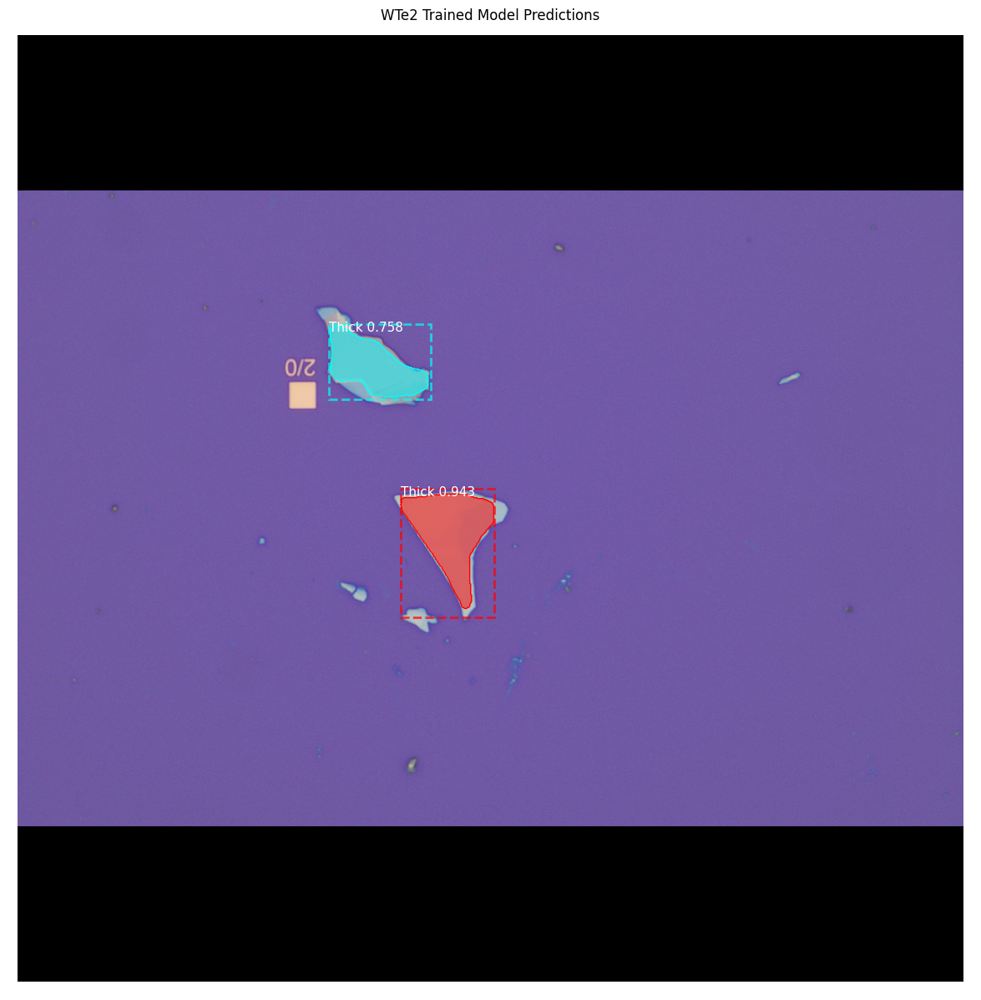

In [15]:
run_model.run(image_idx=0, dataset=bep_val)

image_id:  0 
Original shape:  (2076, 3088, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  245.00000  uint8
mask                     shape: (1024, 1024, 3)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (3,)                  min:    3.00000  max:    3.00000  int32
[3 3 3]
bbox                     shape: (3, 4)                min:  443.00000  max:  634.00000  int32


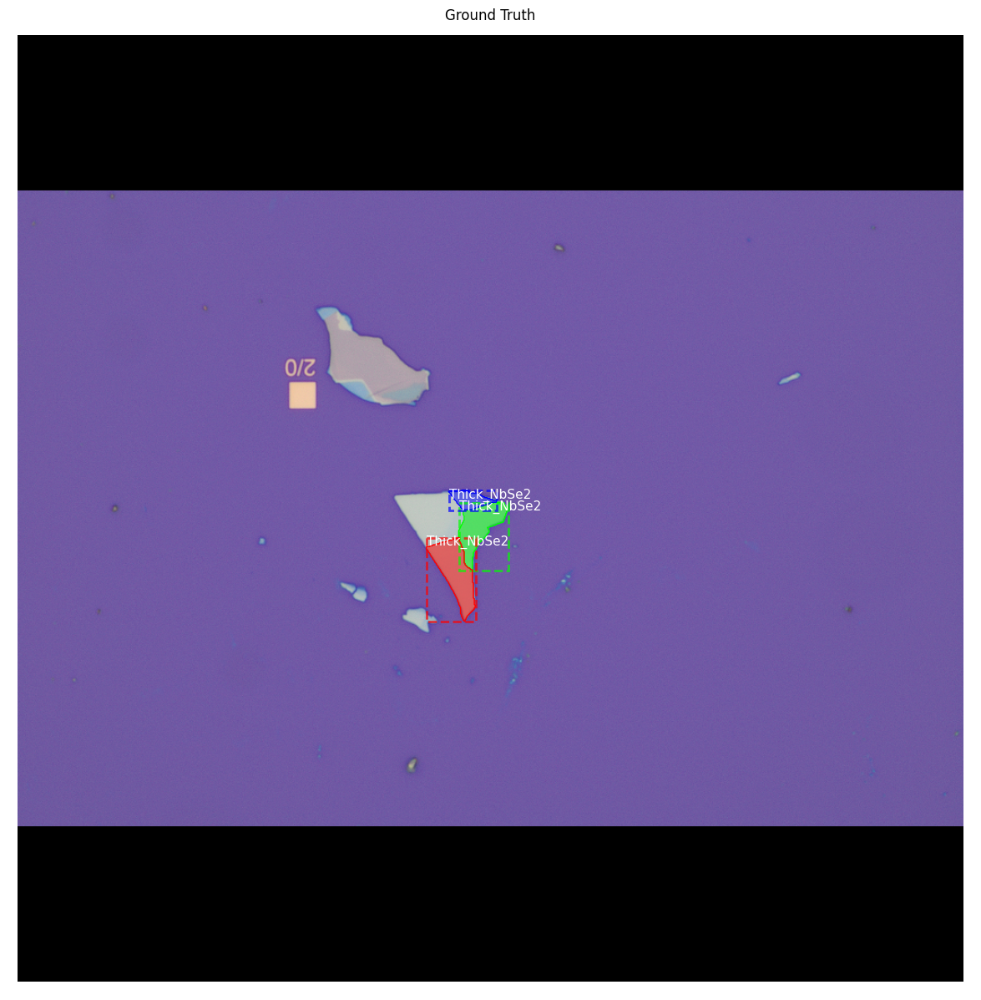

In [16]:
run_model.gt()

#### Image 2

image ID: ali.2 (1) 
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  246.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  122.30000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32

*** No instances to display *** 

gt_class_id              shape: (1,)                  min:    3.00000  max:    3.00000  int32
gt_bbox                  shape: (1, 4)                min:  439.00000  max:  543.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool


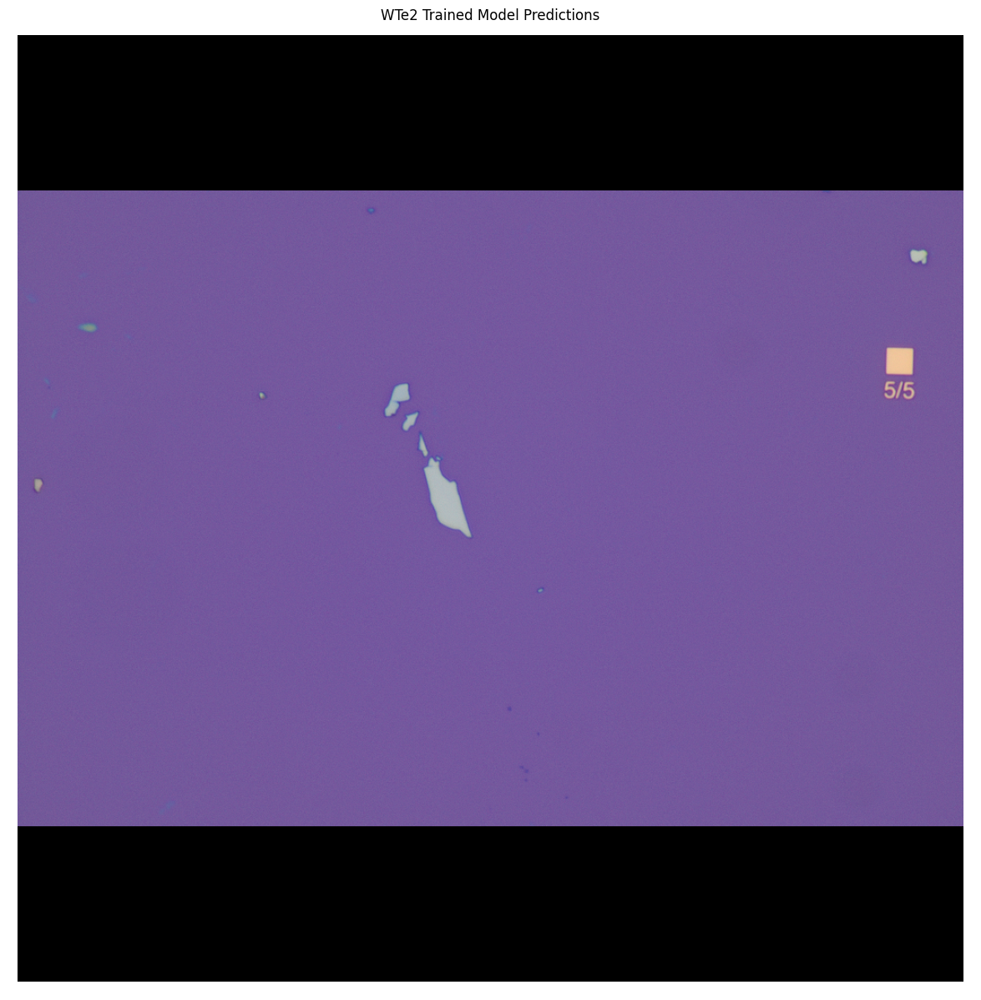

In [17]:
run_model.run(image_idx=1, dataset=bep_val)

image_id:  1 
Original shape:  (2076, 3088, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  246.00000  uint8
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    3.00000  max:    3.00000  int32
[3]
bbox                     shape: (1, 4)                min:  439.00000  max:  543.00000  int32


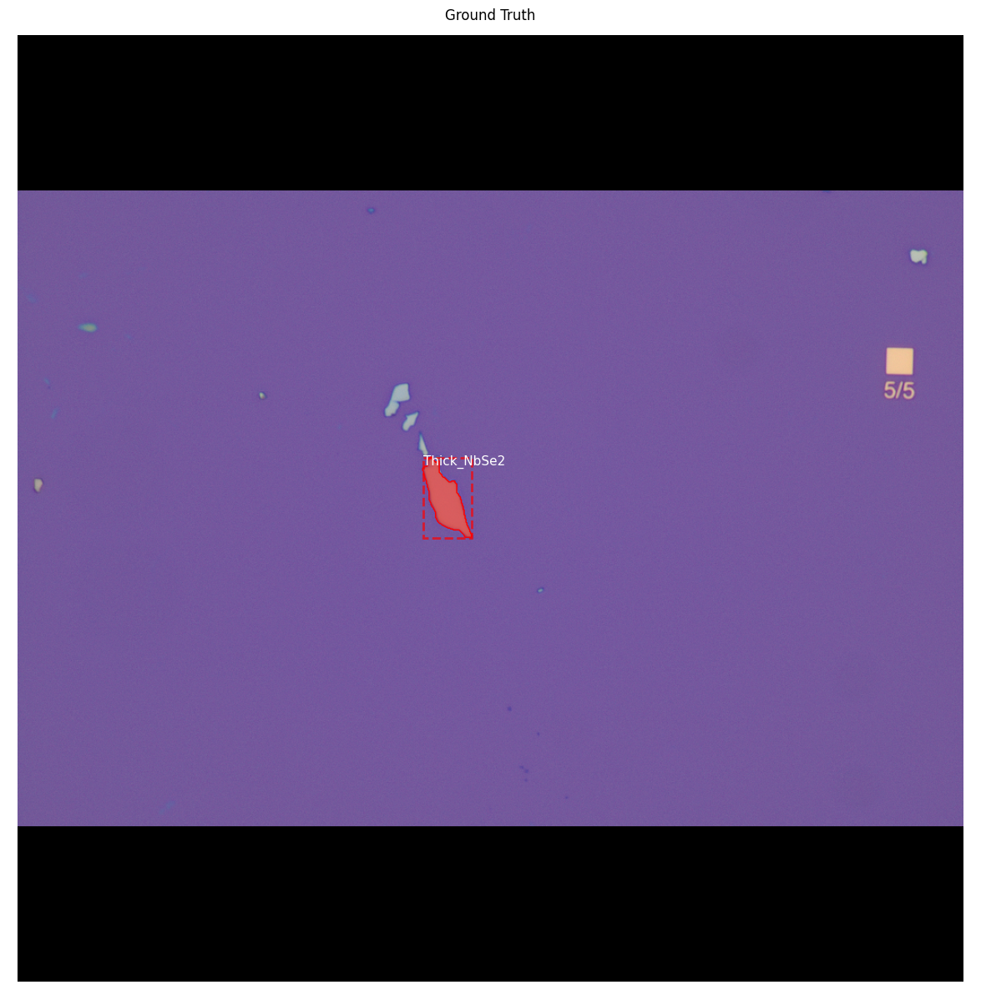

In [18]:
run_model.gt()

#### Image 3

image ID: ali.3 (2) 
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32

*** No instances to display *** 

gt_class_id              shape: (2,)                  min:    3.00000  max:    3.00000  int32
gt_bbox                  shape: (2, 4)                min:  443.00000  max:  597.00000  int32
gt_mask                  shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  bool


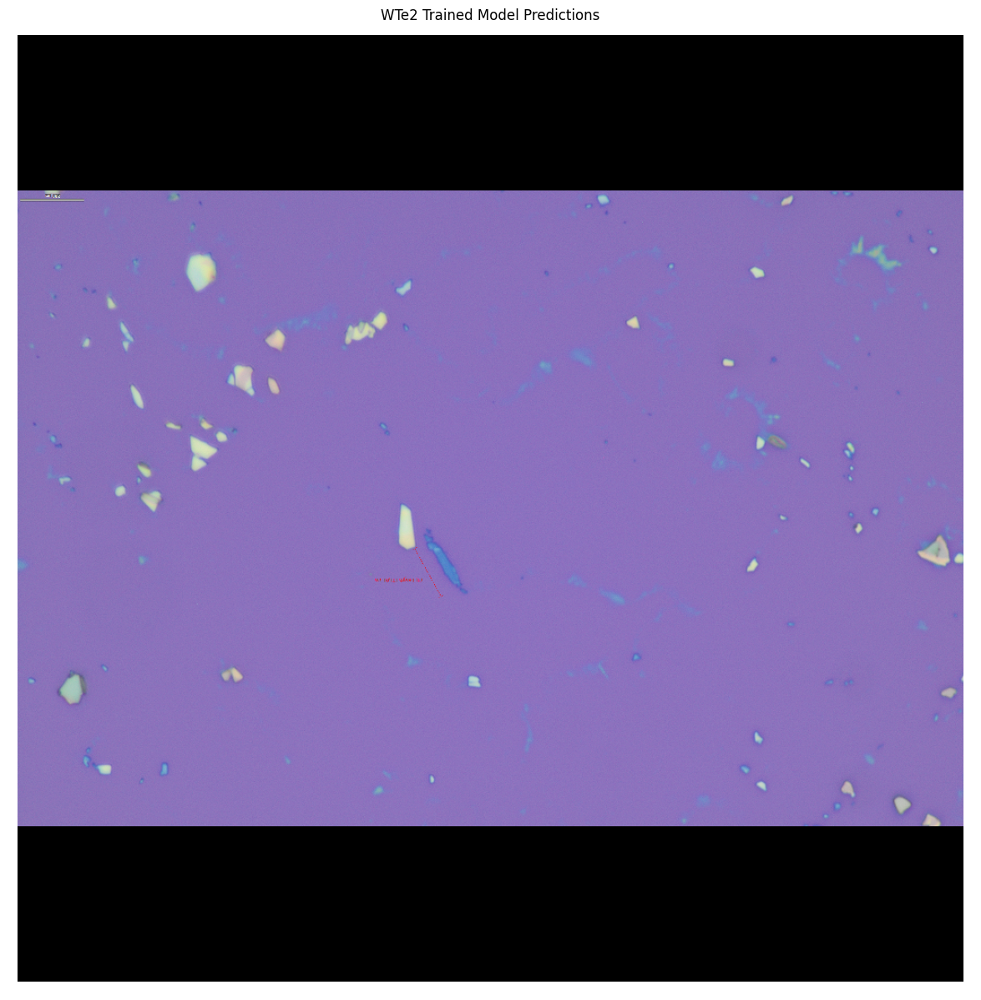

In [19]:
run_model.run(image_idx=2, dataset=bep_val)

image_id:  2 
Original shape:  (2076, 3088, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (2,)                  min:    3.00000  max:    3.00000  int32
[3 3]
bbox                     shape: (2, 4)                min:  443.00000  max:  597.00000  int32


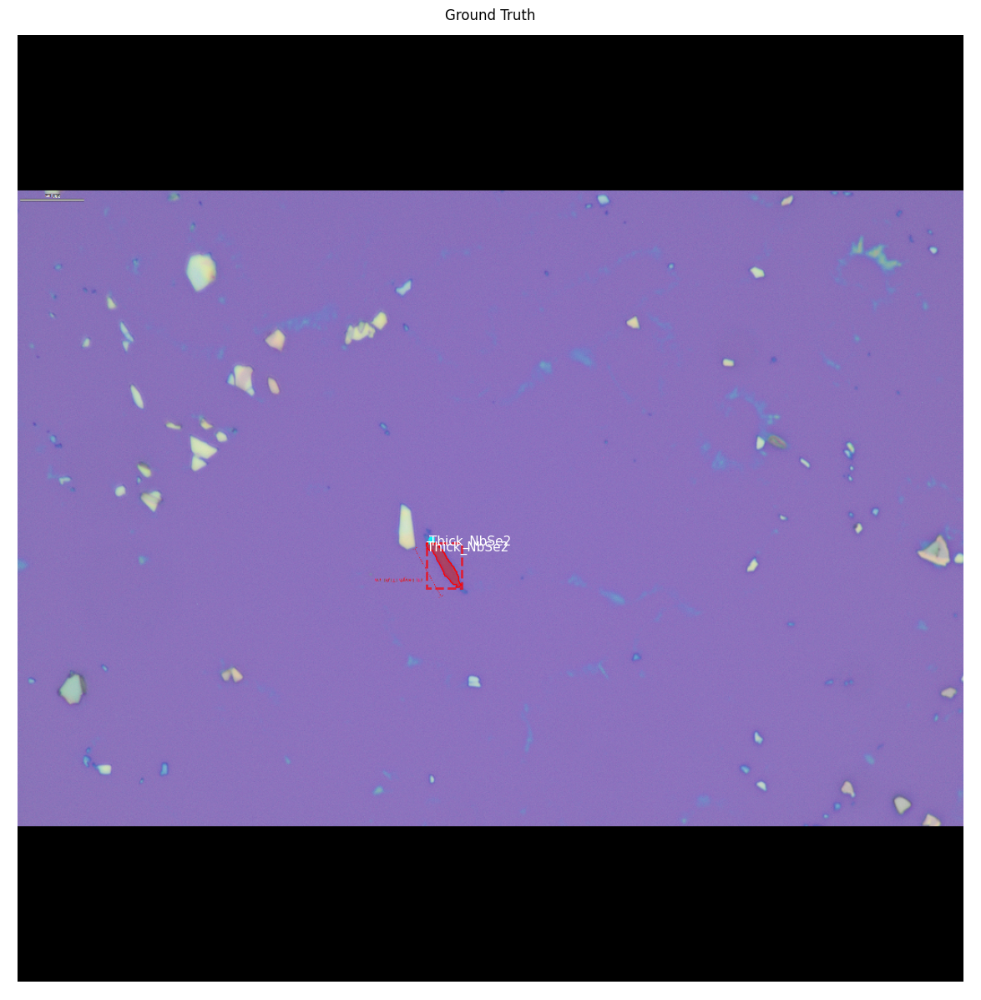

In [20]:
run_model.gt()